In [1]:
import gzip
import pickle 
import mplhep as hep
hep.style.use("CMS")
import matplotlib
matplotlib.rc('font', size=15)
import numpy as np
import torch 
import dgl
import pandas as pd
import numpy as np
import plotly.express as px
sys.path.append("/afs/cern.ch/work/m/mgarciam/private/mlpf/")
from sklearn.cluster import DBSCAN, HDBSCAN
from torch_scatter import scatter_max, scatter_add, scatter_mean
from src.layers.inference_oc import get_clustering, obtain_intersection_values
from scipy.optimize import linear_sum_assignment
import numpy as np
import matplotlib.pyplot as plt

In [48]:
np.min(y.T[:,1])

0.0

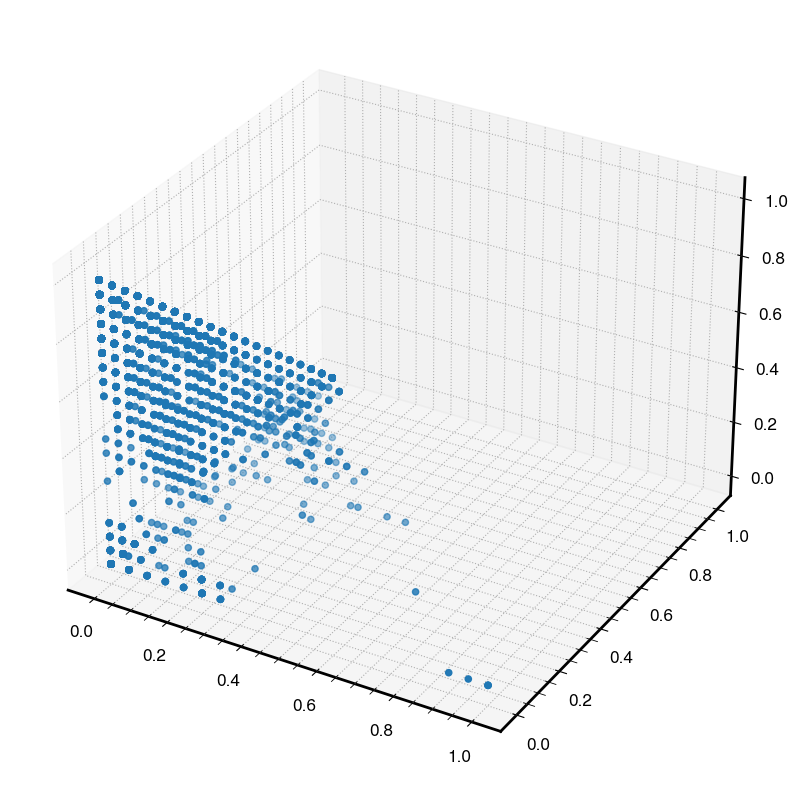

In [46]:
ax = plt.figure().add_subplot(projection='3d')

# Plot a sin curve using the x and y axes.
number_points = 10000
ax.scatter(y.T[0:number_points,0], y.T[0:number_points,1], y.T[0:number_points,2] )


average F1 of random forest prediction: 0.55


Cut-pursuit initialization:
	1 connected component(s), 0 saturated, and 1 reduced edge(s).
	elapsed time 0.2 s.

Cut-pursuit iteration 1 (max. 10): 
	Split... 51135 new activated edge(s).
	Compute connected components... 251 connected component(s), 0 saturated.
	Compute reduced graph... 270 reduced edge(s).
	Solve reduced problem: 
	Merge... 47246 deactivated edge(s).
	relative iterate evolution 2.69e+00 (tol. 1.00e-03)
	207 connected component(s), 0 saturated, and 209 reduced edge(s).
	elapsed time 23.3 s.

Cut-pursuit iteration 2 (max. 10): 
	Split... 18457 new activated edge(s).
	Compute connected components... 228 connected component(s), 200 saturated.
	Compute reduced graph... 238 reduced edge(s).
	Solve reduced problem: 
	Merge... 18253 deactivated edge(s).
	relative iterate evolution 2.76e-02 (tol. 1.00e-03)
	219 connected component(s), 202 saturated, and 224 reduced edge(s).
	elapsed time 39.3 s.

Cut-pursuit iteration 3 (max. 10)

Text(0, 1, 'KL$^{(0.1)}$(y||x) + ||x||$_{\\delta_{0}}$')

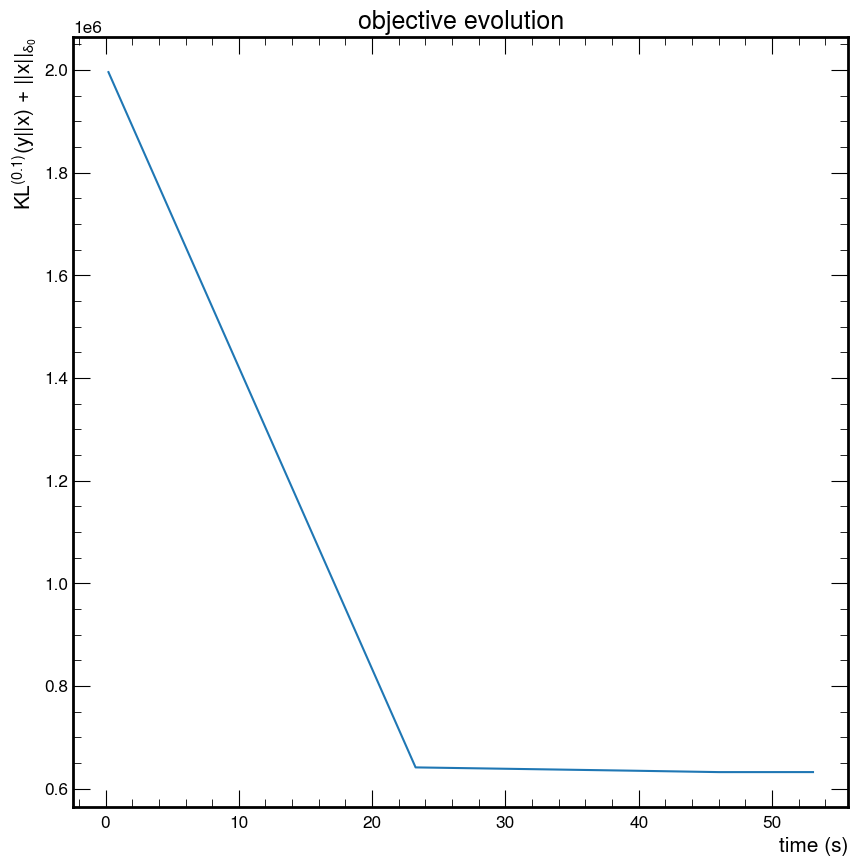

In [4]:
import sys
import os 
import numpy as np
import scipy.io
import time
import matplotlib.pyplot as plt



###  classes involved in the task  ###
classNames = ["road", "vegetation", "facade", "hardscape",
        "scanning artifacts", "cars"]
classId = np.arange(1, 7, dtype="uint8")

###  parameters; see documentations of cp_d0_dist  ###
K = 3
cp_dif_tol = 1e-3
max_num_threads = 0
balance_parallel_split = True

###  initialize data  ###
mat = scipy.io.loadmat("labeling_3D.mat",
    squeeze_me=True)
loss = mat["loss"]
y = mat["y"]
homo_d1_weight = mat["homo_d1_weight"]
ground_truth = mat["ground_truth"]
first_edge = mat["first_edge"]
adj_vertices = mat["adj_vertices"]
homo_d0_weight = 3*homo_d1_weight; # adjusted for d0 norm by trial-and-error

# compute prediction performance of random forest
ML = np.argmax(y, axis=0) + 1
F1 = np.zeros(len(classNames),)
for k in range(1,len(classNames) + 1):
    predk = np.array(ML == classId[k-1], dtype="int")
    truek = np.array(ground_truth == classId[k-1], dtype="int")
    F1[k-1] = (2*np.array((predk + truek) == 2, dtype = "int").sum()
               /(predk.sum() + truek.sum()))
print("\naverage F1 of random forest prediction: {:.2f}\n\n".format(F1.mean()))
del predk, truek

###  solve the optimization problem  ###
start_time = time.time()
Comp, rX, Obj, Time = cp_d0_dist.cp_d0_dist(loss, y, first_edge, adj_vertices,
    edge_weights=homo_d0_weight, K=K, cp_dif_tol=cp_dif_tol,
    max_num_threads=max_num_threads,
    balance_parallel_split=balance_parallel_split, compute_Obj=True,
    compute_Time=True)
exec_time = time.time() - start_time
x = rX[:,Comp] # rX is components values, Comp is components assignment
del Comp, rX
print("Total python wrapper execution time {:.0f} s\n\n".format(exec_time))

# compute prediction performance of spatially regularized prediction
ML = np.argmax(x, axis=0) + 1
F1 = np.zeros(len(classNames),)
for k in range(1,len(classNames) + 1):
    predk = np.array(ML == classId[k-1], dtype="int")
    truek = np.array(ground_truth == classId[k-1], dtype="int")
    F1[k-1] = (2*np.array((predk + truek) == 2).sum()
               /(predk.sum() + truek.sum()))
print(("\naverage F1 of spatially regularized prediction: "
       "{:.2f}\n\n").format(F1.mean()))
del predk, truek

fig = plt.figure(1)
fig.clear()
ax = fig.add_subplot(111)
ax.plot(Time, Obj)
ax.set_title("objective evolution")
ax.set_xlabel("time (s)")
ax.set_ylabel('KL$^{{({:.1f})}}$(y||x) + ||x||$_{{\delta_{{0}}}}$'.
    format(loss))


In [18]:
first_edge.shape,adj_vertices.shape

((3000112,), (17206938,))

In [2]:
import os.path as osp
dependencies_folder = osp.dirname(osp.dirname(osp.abspath("/afs/cern.ch/work/m/mgarciam/private/mlpf/")))
sys.path.append(dependencies_folder)
sys.path.append(osp.join(dependencies_folder, "dependencies/grid_graph/python/bin"))
sys.path.append(osp.join(dependencies_folder, "dependencies/parallel_cut_pursuit/python/wrappers"))


In [3]:
from src.dependencies.grid_graph.python.bin.grid_graph import edge_list_to_forward_star
from src.dependencies.parallel_cut_pursuit.python.wrappers import cp_d0_dist

In [6]:
dic = torch.load("/eos/user/m/mgarciam/datasets_mlpf/models_trained_CLD/280324_gravnet/showers_df_evaluation/graphs_all_comparing/0_0_2.pt", map_location='cpu')


In [7]:
from torch_geometric.data import Data 
pos = dic["graph"].ndata["pos_hits_xyz"]
x= dic["graph"].ndata["h"][:,3:]
knn_g = dgl.knn_graph(pos, 20)  # Each node has two predecessors
knn_g = dgl.remove_self_loop(knn_g)
i,j = knn_g.edges()
edge_index = torch.cat((i.view(1,-1),j.view(1,-1)),dim=0)
data = Data(pos=pos, x=x, edge_index=edge_index)

In [19]:

regularization=1
spatial_weight=100
cutoff=1
parallel=True
iterations=10
k_adjacency=5
verbose=False
d1 = data
n_dim = data.pos.shape[1]
n_feat = data.x.shape[1] if data.x is not None else 0
reg = regularization
cut = cutoff
# Convert edges to forward-star (or CSR) representation
source_csr, target, reindex = edge_list_to_forward_star(
    d1.num_nodes, d1.edge_index.T.contiguous().cpu().numpy())
source_csr = source_csr.astype('uint32')
target = target.astype('uint32')
edge_weights = d1.edge_attr.cpu().numpy()[reindex] * reg \
    if d1.edge_attr is not None else reg
print(source_csr.shape,target.shape )


(726,) (13775,)


In [51]:
x[0:5,:]

tensor([[-9.1779e-01,  3.4613e-01, -1.9452e-01,  7.8355e-04,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  4.6876e-03],
        [ 4.5532e-01, -8.7411e-01,  1.6916e-01,  4.2591e-04,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  2.6532e-03],
        [ 9.0147e-01,  4.0577e-01, -1.5067e-01,  3.2287e-04,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  2.4376e-04],
        [-9.4959e-01,  2.3541e-01, -2.0704e-01,  0.0000e+00,  7.0845e-04,
          0.0000e+00,  1.2459e-05,  0.0000e+00],
        [-9.5039e-01,  2.3199e-01, -2.0721e-01,  0.0000e+00,  7.0905e-04,
          0.0000e+00,  1.4256e-05,  0.0000e+00]])

In [35]:

# Recover attributes features from Data object
pos_offset = d1.pos.mean(dim=0)
if d1.x is not None:
    x = torch.cat((d1.pos - pos_offset, d1.x), dim=1)
else:
    x = d1.pos - pos_offset
x = torch.nn.functional.normalize(x,dim=1)
X1 = np.asfortranarray(x[:,0:3].cpu().numpy().T)

coor_weights = np.ones(n_dim , dtype=np.float32)
coor_weights[:n_dim] *= spatial_weight


In [36]:
node_size = torch.ones(
            d1.num_nodes, dtype=torch.long).float().cpu().numpy()

In [37]:
X1

array([[-0.91778797,  0.45532182,  0.9014695 , ..., -0.9758703 ,
        -0.97670317, -0.94627213],
       [ 0.34613   , -0.87410605,  0.40577295, ...,  0.14728917,
         0.14475526,  0.24123317],
       [-0.19451666,  0.16915512, -0.15066765, ..., -0.16119136,
        -0.15841828, -0.21534918]], dtype=float32)

In [38]:
# Comp, rX, Obj, Time = cp_d0_dist.cp_d0_dist(loss, y, first_edge, adj_vertices,
#     edge_weights=homo_d0_weight, K=K, cp_dif_tol=cp_dif_tol,
#     max_num_threads=max_num_threads,
#     balance_parallel_split=balance_parallel_split, compute_Obj=True,
#     compute_Time=True)
# Partition computation
Comp, rX, Obj, Time  = cp_d0_dist.cp_d0_dist(
    0.1,
    X1,
    source_csr,
    target,
    edge_weights=edge_weights,
    # vert_weights=node_size,
    # coor_weights=coor_weights,
    # min_comp_weight=0.1,
    cp_dif_tol=1e-6,
    K=3,
    cp_it_max=iterations,
    split_damp_ratio=0.1,
    verbose=True,
    max_num_threads=1,
    balance_parallel_split=False,
    compute_Time=True,
    compute_Obj=True)
    # compute_Graph=True)

Cut-pursuit initialization:
	1 connected component(s), 0 saturated, and 1 reduced edge(s).
	elapsed time 0.0 s.

Cut-pursuit iteration 1 (max. 10): 
	Split... 0 new activated edge(s).
	relative iterate evolution 0.00e+00 (tol. 1.00e-06)
	1 connected component(s), 1 saturated, and 1 reduced edge(s).
	elapsed time 0.0 s.



In [ ]:

_MAX_NUM_EDGES = 4294967295
_NO_REPR = ['verbose', 'parallel']

regularization=5e-2
spatial_weight=1
cutoff=10,
parallel=True
iterations=10
k_adjacency=5
verbose=False

   
assert data.has_edges, \
    "Cannot compute partition, no edges in Data"
assert data.num_nodes < np.iinfo(np.uint32).max, \
    "Too many nodes for `uint32` indices"
assert data.num_edges < np.iinfo(np.uint32).max, \
    "Too many edges for `uint32` indices"
assert isinstance(regularization, (int, float, list)), \
    "Expected a scalar or a List"
assert isinstance(cutoff, (int, list)), \
    "Expected an int or a List"
assert isinstance(spatial_weight, (int, float, list)), \
    "Expected a scalar or a List"

# Initialize the hierarchical partition parameters. In particular,
# prepare the output as list of Data objects that will be stored in
# a NAG structure
num_threads =  1
data.node_size = torch.ones(
    data.num_nodes, device=data.device, dtype=torch.long)  # level-0 points all have the same importance
data_list = [data]
regularization = regularization
if not isinstance(regularization, list):
    regularization = [regularization]
cutoff = cutoff
if isinstance(cutoff, int):
    cutoff = [cutoff] * len(regularization)
spatial_weight = spatial_weight
if isinstance(spatial_weight, (float, int)):
    spatial_weight = [spatial_weight] * len(regularization)
assert len(regularization) == len(cutoff) == len(spatial_weight)
n_dim = data.pos.shape[1]
n_feat = data.x.shape[1] if data.x is not None else 0

# Iteratively run the partition on the previous partition level
for level, (reg, cut, sw) in enumerate(zip(
        regularization, cutoff, spatial_weight)):

    if verbose:
        print(
            f'Launching partition level={level} reg={reg}, '
            f'cutoff={cut}')

    # Recover the Data object on which we will run the partition
    d1 = data_list[level]

    # Exit if the graph contains only one node
    if d1.num_nodes < 2:
        break

    # Convert edges to forward-star (or CSR) representation
    source_csr, target, reindex = edge_list_to_forward_star(
        d1.num_nodes, d1.edge_index.T.contiguous().cpu().numpy())
    source_csr = source_csr.astype('uint32')
    target = target.astype('uint32')
    edge_weights = d1.edge_attr.cpu().numpy()[reindex] * reg \
        if d1.edge_attr is not None else reg

    # Recover attributes features from Data object
    pos_offset = d1.pos.mean(dim=0)
    if d1.x is not None:
        x = torch.cat((d1.pos - pos_offset, d1.x), dim=1)
    else:
        x = d1.pos - pos_offset
    x = np.asfortranarray(x.cpu().numpy().T)
    node_size = d1.node_size.float().cpu().numpy()
    coor_weights = np.ones(n_dim + n_feat, dtype=np.float32)
    coor_weights[:n_dim] *= sw

    # Partition computation
    super_index, x_c, cluster, edges, times = cp_d0_dist(
        n_dim + n_feat,
        x,
        source_csr,
        target,
        edge_weights=edge_weights,
        vert_weights=node_size,
        coor_weights=coor_weights,
        min_comp_weight=cut,
        cp_dif_tol=1e-2,
        cp_it_max=self.iterations,
        split_damp_ratio=0.7,
        verbose=self.verbose,
        max_num_threads=num_threads,
        balance_parallel_split=True,
        compute_Time=True,
        compute_List=True,
        compute_Graph=True)

    if self.verbose:
        delta_t = (times[1:] - times[:-1]).round(2)
        print(f'Level {level} iteration times: {delta_t}')
        print(f'partition {level} done')

    # Save the super_index for the i-level
    super_index = torch.from_numpy(super_index.astype('int64'))
    d1.super_index = super_index

    # Save cluster information in another Data object. Convert
    # cluster-to-point indices in a CSR format
    size = torch.LongTensor([c.shape[0] for c in cluster])
    pointer = torch.cat([torch.LongTensor([0]), size.cumsum(dim=0)])
    value = torch.cat([
        torch.from_numpy(x.astype('int64')) for x in cluster])
    pos = torch.from_numpy(x_c[:n_dim].T) + pos_offset.cpu()
    x = torch.from_numpy(x_c[n_dim:].T)
    s = torch.arange(edges[0].shape[0] - 1).repeat_interleave(
        torch.from_numpy((edges[0][1:] - edges[0][:-1]).astype("int64")))
    t = torch.from_numpy(edges[1].astype("int64"))
    edge_index = torch.vstack((s, t))
    edge_attr = torch.from_numpy(edges[2] / reg)
    node_size = torch.from_numpy(node_size)
    node_size_new = scatter_sum(
        node_size.cuda(), super_index.cuda(), dim=0).cpu().long()
    d2 = Data(
        pos=pos, x=x, edge_index=edge_index, edge_attr=edge_attr,
        sub=Cluster(pointer, value), node_size=node_size_new)


    # If some nodes are isolated in the graph, connect them to
    # their nearest neighbors, so their absence of connectivity
    # does not "pollute" higher levels of partition
    if d2.num_nodes > 1:
        d2 = d2.connect_isolated(k=self.k_adjacency)



In [15]:
betas  = torch.sigmoid(dic["graph"].ndata["beta"])
X  = dic["graph"].ndata["coords"]
clustering_mode = "clustering_normal"
# if clustering_mode == "clustering_normal":
clustering = get_clustering(betas,X)
map_from = list(np.unique(clustering))
cluster_id = map(lambda x: map_from.index(x), clustering)
clustering_ordered = torch.Tensor(list(cluster_id)).long()
if torch.unique(clustering)[0] != -1:
    clustering = clustering_ordered + 1
else:
    clustering = clustering_ordered
clustering = np.reshape(clustering, (-1))
clustering = torch.Tensor(clustering).long()
# elif clustering_mode == "dbscan":
db = HDBSCAN(min_cluster_size=8, min_samples=8, cluster_selection_epsilon=0.05).fit(X)
labels_hdb = db.labels_ +1
labels_hdb = np.reshape(labels_hdb, (-1))
labels_hdb = torch.Tensor(labels_hdb).long()

labels_pandora = dic["graph"].ndata["pandora_cluster"].long()
labels_pandora = labels_pandora+1
map_from = list(np.unique(labels_pandora))
cluster_id = map(lambda x: map_from.index(x), labels_pandora)
labels_pandora = torch.Tensor(list(cluster_id)).long()
print(dic["part_true"][:,5])
# from src.layers.inference_oc_tracks import match_showers, generate_showers_data_frame
# labels = labels_hdb
# model_output = torch.cat((dic["graph"].ndata["coords"], dic["graph"].ndata["beta"].view(-1,1)), dim=1)
# particle_ids = torch.unique(dic["graph"].ndata["particle_number"])
# shower_p_unique = torch.unique(labels)
# shower_p_unique, row_ind, col_ind, i_m_w, iou_matrix= match_showers(
#     labels,
#     dic,
#     particle_ids,
#     model_output,
#     0,
#     0,
#     None,
# )
# df_event, number_of_showers_total = generate_showers_data_frame(
#                 labels,
#                 dic,
#                 shower_p_unique,
#                 particle_ids,
#                 row_ind,
#                 col_ind,
#                 i_m_w,
#                 number_of_showers_total=0,
#                 step=0,
#                 number_in_batch=0,
#             )
# print(df_event)




tensor([-4.3843e-04, -1.9834e-03,  4.8946e-04, -3.8870e-04, -1.0376e-04,
         9.3956e-01,  0.0000e+00,  0.0000e+00])


In [15]:
# unique_pd = torch.unique(dic["graph"].ndata['particle_number'])
# for jj, i in enumerate(unique_pd):
#     mask = dic["graph"].ndata['particle_number'].view(-1) ==i
#     ind = torch.argmax(betas[mask])
#     part_n = dic["graph"].ndata['particle_number'][mask][0]-1
#     print(jj, dic["part_true"][:,5][part_n.long()],torch.max(betas[mask]),torch.max(torch.norm(X[mask]-X[mask][ind], dim=-1)))

In [6]:
# y =dic["part_true"]
# parents = y[:, -1]
# particle_ids = y[:, 4]
# change_pairs = []
# for indx, i in enumerate(parents):
#     if torch.sum(particle_ids == i) > 0:
#         change_pairs.append([parents[indx], particle_ids[indx]])
# print("change_pairs", change_pairs)


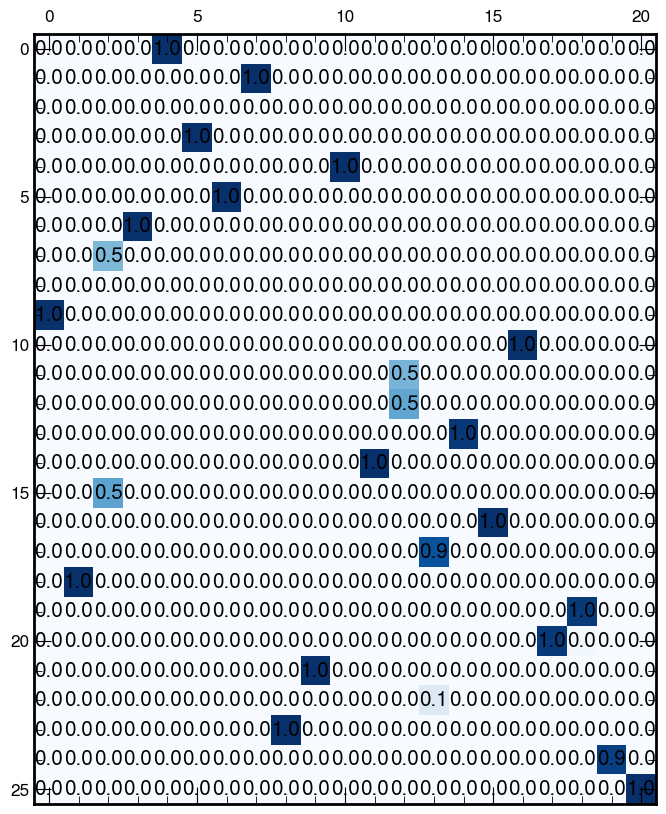

In [15]:

iou_matrix = torch.transpose(iou_matrix[1:, :], 1, 0)
fig, ax = plt.subplots()
iou_matrix = iou_matrix.detach().cpu().numpy()
ax.matshow(iou_matrix, cmap=plt.cm.Blues)
for i in range(0, iou_matrix.shape[1]):
    for j in range(0, iou_matrix.shape[0]):
        c = np.round(iou_matrix[j, i], 1)
        ax.text(i, j, str(c), va="center", ha="center")

# id_p = 11
# a = torch.sum((dic["graph"].ndata["particle_number"] == id_p)  * (torch.argmax(dic["graph"].ndata["hit_type"], dim=1)==0))
# b = torch.sum((dic["graph"].ndata["particle_number"] == id_p)  * (torch.argmax(dic["graph"].ndata["hit_type"], dim=1)==1))
# c = torch.sum((dic["graph"].ndata["particle_number"] == id_p)  * (torch.argmax(dic["graph"].ndata["hit_type"], dim=1)==2))
# d = torch.sum((dic["graph"].ndata["particle_number"] == id_p)  * (torch.argmax(dic["graph"].ndata["hit_type"], dim=1)==3))
# print(a,b,c,d)

In [16]:
labels = clustering
from src.layers.inference_oc import obtain_intersection_matrix, obtain_union_matrix, match_showers, generate_showers_data_frame
model_output = torch.cat((dic["graph"].ndata["coords"],dic["graph"].ndata["beta"].view(-1,1)), dim=1)
particle_ids = torch.unique(dic["graph"].ndata["particle_number"])

shower_p_unique_hdb, row_ind_hdb, col_ind_hdb, i_m_w_hdb, iou_matrix = match_showers(
            clustering,
            dic,
            particle_ids,
            model_output,
            1,
            0,
            0,
            hdbscan=True,
        )
df_event, number_of_showers_total = generate_showers_data_frame(
                labels,
                dic,
                shower_p_unique_hdb,
                particle_ids,
                row_ind_hdb,
                col_ind_hdb,
                i_m_w_hdb,
                e_corr=None,
                number_of_showers_total=0,
                step=0,
                number_in_batch=0,
            )

shower_p_unique_hdb, row_ind_hdb, col_ind_hdb, i_m_w_hdb, iou_matrix = match_showers(
            labels_hdb,
            dic,
            particle_ids,
            model_output,
            1,
            0,
            0,
            hdbscan=True,
        )
(
    shower_p_unique_pandora,
    row_ind_pandora,
    col_ind_pandora,
    i_m_w_pandora,
    iou_p
) = match_showers(
    labels_pandora,
    dic,
    particle_ids,
    model_output,
    1,
    0,
    0,
    pandora=True,
)
i =0 
tracking =False
step = 0

df_event1, number_of_showers_total1 = generate_showers_data_frame(
                labels_hdb,
                dic,
                shower_p_unique_hdb,
                particle_ids,
                row_ind_hdb,
                col_ind_hdb,
                i_m_w_hdb,
                e_corr=None,
                step=step,
                number_of_showers_total=0,
                number_in_batch=i,
            )

df_event_pandora = generate_showers_data_frame(
                    labels_pandora,
                    dic,
                    shower_p_unique_pandora,
                    particle_ids,
                    row_ind_pandora,
                    col_ind_pandora,
                    i_m_w_pandora,
                    pandora=True,
                    tracking=tracking,
                    step=step,
                    number_in_batch=i,
                )

In [17]:
df_event1

,true_showers_E,reco_showers_E,pred_showers_E,e_pred_and_truth,pid,calibration_factor,calibrated_E,step,number_batch
0,1.459501,1.398881,1.398881,1.398881,22.0,1.0,1.398881,0.0,0.0
1,6.250600,6.247137,6.241380,6.241380,-11.0,1.0,6.241380,0.0,0.0
2,5.910359,2.392106,4.354634,2.392106,11.0,1.0,4.354634,0.0,0.0
3,1.226552,1.299985,1.299985,1.299985,22.0,1.0,1.299985,0.0,0.0
4,0.756517,0.565980,0.605348,0.565980,-11.0,1.0,0.605348,0.0,0.0
5,3.240177,1.962527,NaN,NaN,2112.0,NaN,NaN,0.0,0.0
6,3.552042,3.855478,3.855478,3.855478,22.0,1.0,3.855478,0.0,0.0
7,0.068921,0.033612,NaN,NaN,22.0,NaN,NaN,0.0,0.0


In [18]:
df_event_pandora

,true_showers_E,reco_showers_E,pred_showers_E,e_pred_and_truth,pandora_calibrated_E,pandora_calibrated_pfo,pid,step,number_batch
0,1.459501,1.398881,1.348697,1.348697,1.372663,1.372663,22.0,0.0,0.0
1,6.250600,6.247137,6.055466,6.055466,6.128255,6.229660,-11.0,0.0,0.0
2,5.910359,2.392106,0.665640,0.665640,0.715622,5.984380,11.0,0.0,0.0
3,1.226552,1.299985,1.250400,1.250400,1.272620,1.272620,22.0,0.0,0.0
4,0.756517,0.565980,0.546155,0.546155,0.545121,0.755202,-11.0,0.0,0.0
5,3.240177,1.962527,3.473165,1.828609,3.534881,3.534881,2112.0,0.0,0.0
6,3.552042,3.855478,3.718906,3.718906,3.784995,3.784995,22.0,0.0,0.0
7,0.068921,0.033612,0.033612,0.033612,0.257560,0.257560,22.0,0.0,0.0


In [6]:
# weights = torch.ones_like(dic["graph"].ndata["particle_number"])
# for i in torch.unique(dic["graph"].ndata["particle_number"]):   
#     mask  = dic["graph"].ndata["particle_number"] == i
#     mask2 = mask* (dic["graph"].ndata["hit_type"]==1)
#     mask3 = mask* (dic["graph"].ndata["hit_type"]==0)
#     a = dic["graph"].ndata["hit_type"][mask]
#     total_hits = len(a)
#     n_vtx_hits = torch.sum(a)
#     n_dch = total_hits-torch.sum(a)
#     print(i, total_hits,n_vtx_hits,n_dch)
#     if n_dch>0 and n_vtx_hits>0:
#             weights[mask3] = total_hits/(2*n_dch)
#             weights[mask2] = total_hits/(2*n_vtx_hits)
    

In [19]:
# pp = [3,6]
# mask = (dic["graph"].ndata['particle_number'].view(-1) !=-1)
# # mask =  (labels == 12)+(labels == 17)+(labels == 18) +(labels == 9) 
# for i in pp:
#     mask = mask +  (dic["graph"].ndata['particle_number'].view(-1) ==i)
# tidx = labels[mask].view(-1,1) #1*(dic["graph"].ndata['particle_number'][mask].view(-1,1)) #(labels.view(-1,1))
# features =  torch.sigmoid(dic["graph"].ndata["beta"][mask])
# X =dic["graph"].ndata["coords"][mask] # dic["graph"].ndata["pos_hits_xyz"] #dic["graph"].ndata["pos_hits_xyz"]
# data = {
#             "X":X[:, 0].view(-1, 1).detach().cpu().numpy(),
#             "Y": X[:, 1].view(-1, 1).detach().cpu().numpy(),
#             "Z": X[:, 2].view(-1, 1).detach().cpu().numpy(),
#             "tIdx": tidx,
#             "features": features.view(-1, 1).detach().cpu().numpy(),
#         }
# hoverdict = {}
# # if hoverfeat is not None:
# #     for j in range(hoverfeat.shape[1]):
# #         hoverdict["f_" + str(j)] = hoverfeat[:, j : j + 1]
# #     data.update(hoverdict)

# # if nidx is not None:
# #     data.update({"av_same": av_same})

# df = pd.DataFrame(
# np.concatenate([data[k] for k in data], axis=1),
# columns=[k for k in data],
# )
# rdst = np.random.RandomState(1234567890)  # all the same
# # shuffle_truth_colors(df, "tIdx", rdst)

# hover_data = ["tIdx"] #+ [k for k in hoverdict.keys()]
# # if nidx is not None:
# #     hover_data.append("av_same")
# fig = px.scatter_3d(
# df,
# x="X",
# y="Y",
# z="Z",
# color="tIdx",
# size="features",
# hover_data=hover_data,
# template="plotly_dark",
# color_continuous_scale=px.colors.sequential.Rainbow,
# )
# fig.update_traces(marker=dict(line=dict(width=0)))

In [20]:
from src.logger.plotting_tools import shuffle_truth_colors
pp = [10]
mask =  (dic["graph"].ndata['particle_number'].view(-1)!=-1)
for i in pp:
    mask = mask +  (dic["graph"].ndata['particle_number'].view(-1) ==i)
#mask =(dic["graph"].ndata['particle_number'].view(-1) !=-1) #+(dic["graph"].ndata['particle_number'].view(-1) ==25)   + (dic["graph"].ndata['particle_number'].view(-1) ==20)+ (dic["graph"].ndata['particle_number'].view(-1) ==12)+ (dic["graph"].ndata['particle_number'].view(-1) ==15)
tidx =  1*(dic["graph"].ndata['particle_number'].view(-1,1)[mask])# +1*(dic["graph"].ndata['particle_number_nomap'].view(-1,1)[mask]==189)#(labels_pandora.view(-1,1))
features = torch.sigmoid(dic["graph"].ndata["beta"][mask]).view(-1,1)
X =dic["graph"].ndata["coords"][mask]#dic["graph"].ndata["pos_hits_xyz"][mask] # dic["graph"].ndata["pos_hits_xyz"] #dic["graph"].ndata["pos_hits_xyz"]
data = {
            "X":X[:, 0].view(-1, 1).detach().cpu().numpy(),
            "Y": X[:, 1].view(-1, 1).detach().cpu().numpy(),
            "Z": X[:, 2].view(-1, 1).detach().cpu().numpy(),
            "tIdx": tidx.view(-1, 1).detach().cpu().numpy(),
            "features": features.view(-1, 1).detach().cpu().numpy(),
        }
hoverdict = {}
# if hoverfeat is not None:
#     for j in range(hoverfeat.shape[1]):
#         hoverdict["f_" + str(j)] = hoverfeat[:, j : j + 1]
#     data.update(hoverdict)

# if nidx is not None:
#     data.update({"av_same": av_same})

df = pd.DataFrame(
np.concatenate([data[k] for k in data], axis=1),
columns=[k for k in data],
)
rdst = np.random.RandomState(1234567890)  # all the same
# shuffle_truth_colors(df, "tIdx", rdst)

hover_data = ["tIdx"] #+ [k for k in hoverdict.keys()]
# if nidx is not None:
#     hover_data.append("av_same")
fig = px.scatter_3d(
df,
x="X",
y="Y",
z="Z",
color="tIdx",
size="features",
hover_data=hover_data,
template="plotly_dark",
color_continuous_scale=px.colors.sequential.Rainbow,
)
fig.update_traces(marker=dict(line=dict(width=0)))

In [72]:
torch.sum(dic["graph"].ndata['hit_type'][mask]==2),torch.sum(dic["graph"].ndata['hit_type'][mask]==3)

(tensor(58), tensor(193))

In [78]:
ecal_hits = scatter_add(1*(dic["graph"].ndata['hit_type']==2), dic["graph"].ndata['particle_number'].view(-1).long())
hcal_hits = scatter_add(1*(dic["graph"].ndata['hit_type']==3), dic["graph"].ndata['particle_number'].view(-1).long())

In [82]:
weights = torch.ones_like(dic["graph"].ndata['hit_type'])

In [93]:
print(ecal_hits)
print(hcal_hits)
weight_ecal_per_object = 1.0*ecal_hits.clone()+1
weight_hcal_per_object = 1.0*ecal_hits.clone()+1
mask =(ecal_hits>2)*(hcal_hits>2)
weight_ecal_per_object[mask] = (ecal_hits+hcal_hits)[mask]/(2*ecal_hits)[mask]
weight_hcal_per_object[mask] = (ecal_hits+hcal_hits)[mask]/(2*hcal_hits)[mask]
print(weight_ecal_per_object)
print(weight_hcal_per_object)


tensor([  0,  58, 445,   0,   0,  85, 138,  77,  36,  41])
tensor([  0, 193,  78,   4, 109,   0,  58,   1,   0,   0])
tensor([ 1.0000,  2.1638,  0.5876,  1.0000,  1.0000, 86.0000,  0.7101, 78.0000,
        37.0000, 42.0000])
tensor([ 1.0000,  0.6503,  3.3526,  1.0000,  1.0000, 86.0000,  1.6897, 78.0000,
        37.0000, 42.0000])


In [92]:
2.1638*58+0.6503*193

251.00830000000002

In [11]:
dic["part_true"][:,5]


tensor([13.0880,  1.7113,  1.8285,  0.1050,  2.1278,  0.5404,  1.0237,  3.4199,
         1.0623,  0.6576,  0.9063,  0.2535,  0.3852,  0.8060,  8.1772,  5.2689,
         0.1015,  0.0384,  0.7845,  0.1765,  0.2769])

In [26]:
parents = dic["part_true"][:,-2]
print(parents)
particle_ids =  dic["part_true"][:, 4]
change_pairs = []
for indx, i in enumerate(parents):
    if torch.sum(particle_ids == i) > 0:
        change_pairs.append([parents[indx], particle_ids[indx]])
print(change_pairs)



tensor([ 24.,  24.,  24.,  24.,  24.,  24.,  24.,  24.,  24.,  61.,  61.,  63.,
         65.,  66.,  66.,  68.,  69.,  70.,  72.,  77.,  80.,  67.,  67.,  67.,
        178.])
[[tensor(67.), tensor(176.)], [tensor(67.), tensor(177.)], [tensor(67.), tensor(178.)], [tensor(178.), tensor(179.)]]


In [25]:
particle_ids

tensor([ 62.,  64.,  67.,  71.,  73.,  75.,  78.,  79.,  81.,  84.,  85.,  86.,
         88.,  90.,  91.,  93.,  95.,  96.,  99., 105., 107., 176., 177., 178.,
        179.])

In [107]:
a = np.exp(np.arange(np.log(0.001), np.log(80), 0.5))

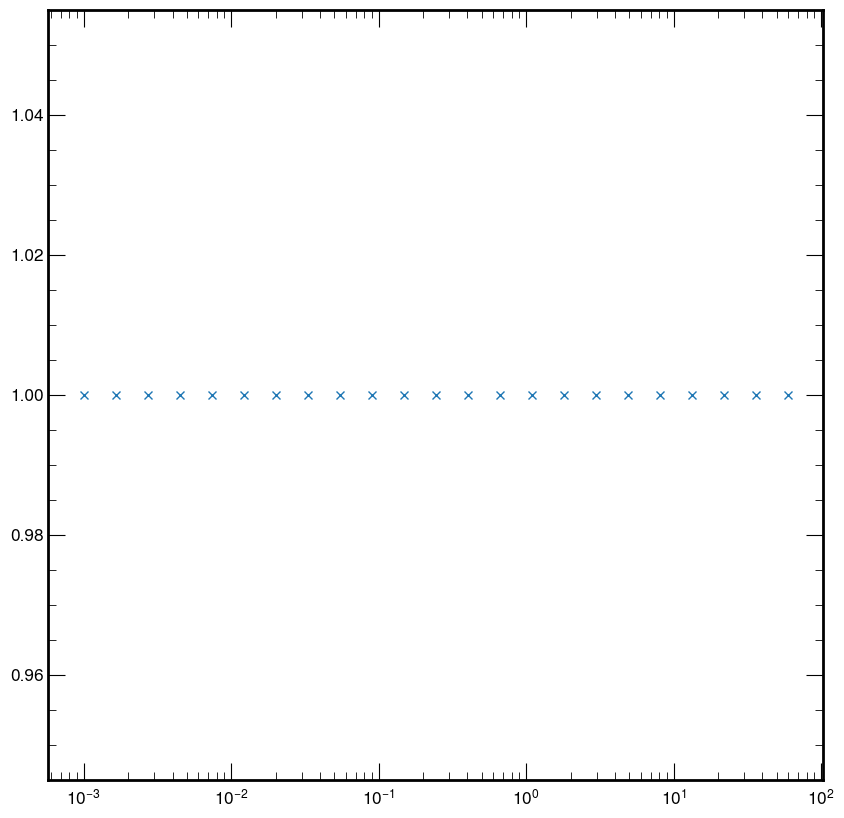

In [109]:
plt.plot(a,np.ones(len(a)),'x')
plt.xscale("log")

In [64]:
print(dic["part_true"][:,3])
print(dic["part_true"][:,4])
print(dic["part_true"][:,5])
print(dic["part_true"][:,6])

tensor([ 1.4387, 16.2788,  8.1231,  2.3531,  1.8258, 36.4957, 40.6092, 11.0805])
tensor([ 1.4319, 16.2788,  8.1231,  2.3531,  1.8258, 36.4836, 40.6092, 11.0805])
tensor([1.3957e-01, 1.2678e-03, 2.2820e-03, 1.8757e-04, 3.8206e-04, 9.3962e-01,
        5.0583e-03, 3.1222e-03])
tensor([ 211.,   22.,  -11.,   22., -211., 2112., -211.,   22.])


In [65]:
dic["graph"].ndata['particle_number']

tensor([7., 3., 5.,  ..., 7., 7., 1.])

In [49]:
from src.logger.plotting_tools import shuffle_truth_colors
mask =(dic["graph"].ndata['particle_number'].view(-1) !=-1) #   + (dic["graph"].ndata['particle_number'].view(-1) ==6 ) 
tidx =  1*(dic["graph"].ndata['particle_number'].view(-1,1)[mask])#(labels_pandora.view(-1,1))
features = (dic["graph"].ndata["e_hits"])[mask]
X =dic["graph"].ndata["pos_hits_xyz"][mask] # dic["graph"].ndata["pos_hits_xyz"] #dic["graph"].ndata["pos_hits_xyz"]
data = {
            "X":X[:, 0].view(-1, 1).detach().cpu().numpy(),
            "Y": X[:, 1].view(-1, 1).detach().cpu().numpy(),
            "Z": X[:, 2].view(-1, 1).detach().cpu().numpy(),
            "tIdx": tidx.view(-1, 1).detach().cpu().numpy(),
            "features": features.view(-1, 1).detach().cpu().numpy(),
        }
hoverdict = {}
# if hoverfeat is not None:
#     for j in range(hoverfeat.shape[1]):
#         hoverdict["f_" + str(j)] = hoverfeat[:, j : j + 1]
#     data.update(hoverdict)

# if nidx is not None:
#     data.update({"av_same": av_same})

df = pd.DataFrame(
np.concatenate([data[k] for k in data], axis=1),
columns=[k for k in data],
)
rdst = np.random.RandomState(1234567890)  # all the same
# shuffle_truth_colors(df, "tIdx", rdst)

hover_data = ["tIdx"] #+ [k for k in hoverdict.keys()]
# if nidx is not None:
#     hover_data.append("av_same")
fig = px.scatter_3d(
df,
x="X",
y="Y",
z="Z",
color="tIdx",
size="features",
hover_data=hover_data,
template="plotly_dark",
color_continuous_scale=px.colors.sequential.Rainbow,
)
fig.update_traces(marker=dict(line=dict(width=0)))

In [27]:
torch.exp(-1*torch.Tensor([5])),torch.exp(-1*torch.Tensor([10]))

(tensor([0.0067]), tensor([4.5400e-05]))

In [21]:
from src.logger.plotting_tools import shuffle_truth_colors
mask =(dic["graph"].ndata['particle_number'].view(-1) !=-1) #   + (dic["graph"].ndata['particle_number'].view(-1) ==6 ) 
tidx =  labels_pandora.view(-1,1)[mask]#(labels_pandora.view(-1,1))
features = (dic["graph"].ndata["e_hits"])[mask]
X =dic["graph"].ndata["pos_hits_xyz"][mask] # dic["graph"].ndata["pos_hits_xyz"] #dic["graph"].ndata["pos_hits_xyz"]
data = {
            "X":X[:, 0].view(-1, 1).detach().cpu().numpy(),
            "Y": X[:, 1].view(-1, 1).detach().cpu().numpy(),
            "Z": X[:, 2].view(-1, 1).detach().cpu().numpy(),
            "tIdx": tidx.view(-1, 1).detach().cpu().numpy(),
            "features": features.view(-1, 1).detach().cpu().numpy(),
        }
hoverdict = {}
# if hoverfeat is not None:
#     for j in range(hoverfeat.shape[1]):
#         hoverdict["f_" + str(j)] = hoverfeat[:, j : j + 1]
#     data.update(hoverdict)

# if nidx is not None:
#     data.update({"av_same": av_same})

df = pd.DataFrame(
np.concatenate([data[k] for k in data], axis=1),
columns=[k for k in data],
)
rdst = np.random.RandomState(1234567890)  # all the same
# shuffle_truth_colors(df, "tIdx", rdst)

hover_data = ["tIdx"] #+ [k for k in hoverdict.keys()]
# if nidx is not None:
#     hover_data.append("av_same")
fig = px.scatter_3d(
df,
x="X",
y="Y",
z="Z",
color="tIdx",
size="features",
hover_data=hover_data,
template="plotly_dark",
color_continuous_scale=px.colors.sequential.Rainbow,
)
fig.update_traces(marker=dict(line=dict(width=0)))

In [97]:
freq_count_particles[number_of_particles_event] = freq_count_particles[number_of_particles_event]+1
freq_count_energy = freq_count_energy + torch.histogram(energy_particles,energy_event)[0]

In [106]:
from torch_scatter import scatter_max, scatter_add, scatter_mean
cluster_space_coords = g.ndata["pos_hits_xyz"]
object_index = g.ndata["particle_number"].view(-1)
x_alpha_sum = scatter_mean(
    cluster_space_coords,
    object_index.long(),dim=0
) 
nVs = x_alpha_sum[1:] / torch.norm(x_alpha_sum[1:], p=2, dim=-1, keepdim=True)
# compute cosine of the angles using dot product
cos_ij = torch.einsum('ij,pj->ip', nVs, nVs)
min_cos_per_particle = torch.min(torch.abs(cos_ij), dim=0)[0]
freq_count_angle = freq_count_angle + torch.histogram(min_cos_per_particle,angle_distribution)[0]

In [109]:
freq_count_angle

tensor([0., 2., 1., 0., 1., 1., 1., 0., 0., 0.])

tensor([[ 22.3746,   4.2995,  -4.4514],
        [ 22.9379,  24.1192, -11.1488],
        [ 21.6913,  -6.8498, -43.0122],
        [ 22.6319,  24.4839,  -3.7761]])

In [34]:
mask = dic["graph"].ndata["particle_number"] == 26
dic["graph"].ndata["particle_number_nomap"][mask]

tensor([237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237.,
        237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237.,
        237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237.,
        237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237.,
        237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237., 237.])

In [31]:
from torch_scatter import scatter_add, scatter_sum, scatter_min, scatter_max
coord = dic["graph"].ndata['pos_hits_xyz']
cluster_id = dic["graph"].ndata['particle_number']
min_x = scatter_min(coord[:, 0], cluster_id.long() - 1)[0]
min_y = scatter_min(coord[:, 1], cluster_id.long() - 1)[0]
min_z = scatter_min(coord[:, 2], cluster_id.long() - 1)[0]
max_x = scatter_max(coord[:, 0], cluster_id.long() - 1)[0]
max_z = scatter_max(coord[:, 2], cluster_id.long() - 1)[0]
max_y = scatter_max(coord[:, 1], cluster_id.long() - 1)[0]
diff_x = torch.abs(torch.abs(max_x) + torch.abs(min_x))
diff_y = torch.abs(torch.abs(max_y) + torch.abs(min_y))
diff_z = torch.abs(max_z - min_z)
print(diff_x)
print(diff_z)
mask_x = diff_x > 1600
mask_z = diff_z > 2800

tensor([1380.5227,  520.2003, 1608.8506,  843.0952,  559.4832, 1348.2191,
        1086.2991,  638.0980, 1093.8938, 1301.5480, 1375.5693,  501.4397,
        1126.8813, 1300.9928, 1473.2686,  376.2064, 1099.7385, 1416.8052,
        1106.4557,  966.0092, 1179.0588, 1546.3901, 1585.1561])
tensor([ 354.8687,  616.8201,  428.9179, 1881.5916,  990.9010, 1118.7372,
        1879.0288,  704.1495, 1158.4973,  429.6730,  969.8974,  695.9861,
        1266.7893, 1508.8146, 2041.9073, 2691.3696, 2627.1597, 2712.9558,
         893.2917, 1959.5400, 2116.6697,  956.1729, 1858.1315])


In [35]:
max_y[9],min_y[9]

(tensor(1440.0493), tensor(13.4809))

In [36]:
diff_y[8],diff_y[14]

(tensor(3454.1001), tensor(3285.2417))

In [150]:
store_image(label=False, cluster=False)
# store_image(label=True, cluster=False)
# store_image(label=False, cluster=False, pandora=True)

In [21]:
store_image(label=False, cluster=True)
store_image(label=True, cluster=True)
store_image(label=False, cluster=True, pandora=True)

In [28]:
from src.logger.plotting_tools import shuffle_truth_colors

def plot_iou_matrix(iou_matrix, image_path):
    iou_matrix = torch.transpose(iou_matrix[1:, :], 1, 0)
    fig, ax = plt.subplots()
    iou_matrix = iou_matrix.detach().cpu().numpy()
    ax.matshow(iou_matrix, cmap=plt.cm.Blues)
    for i in range(0, iou_matrix.shape[1]):
        for j in range(0, iou_matrix.shape[0]):
            c = np.round(iou_matrix[j, i], 1)
            ax.text(i, j, str(c), va="center", ha="center")
def store_image(label=False, cluster = False, pandora = False):
    if label:
        tidx = np.reshape(labels, (-1,1)) 
    elif pandora:
        tidx = np.reshape(labels_pandora, (-1,1))
    else:
        tidx = dic["graph"].ndata['particle_number'].view(-1,1)
    features =  dic["graph"].ndata["e_hits"]*200
    pos_hits =dic["graph"].ndata["pos_hits_xyz"]
    if cluster:
        pos_hits = X
    data = {
                "X": pos_hits[:, 0].view(-1, 1).detach().cpu().numpy(),
                "Y": pos_hits[:, 1].view(-1, 1).detach().cpu().numpy(),
                "Z": pos_hits[:, 2].view(-1, 1).detach().cpu().numpy(),
                "tIdx": tidx,
                "features": features.view(-1, 1).detach().cpu().numpy(),
            }
    hoverdict = {}
    # if hoverfeat is not None:
    #     for j in range(hoverfeat.shape[1]):
    #         hoverdict["f_" + str(j)] = hoverfeat[:, j : j + 1]
    #     data.update(hoverdict)

    # if nidx is not None:
    #     data.update({"av_same": av_same})

    df = pd.DataFrame(
    np.concatenate([data[k] for k in data], axis=1),
    columns=[k for k in data],
    )
    df["orig_tIdx"] = df["tIdx"]
    # rdst = np.random.RandomState(1234567890)  # all the same
    # shuffle_truth_colors(df, "tIdx", rdst)

    # hover_data = ["orig_tIdx", "idx"] + [k for k in hoverdict.keys()]
    # if nidx is not None:
    #     hover_data.append("av_same")
    fig = px.scatter_3d(
    df,
    x="X",
    y="Y",
    z="Z",
    color="tIdx",
    size="features",
    # hover_data=hover_data,
    template="plotly_dark",
    color_continuous_scale=px.colors.sequential.Rainbow,
    )
    fig.update_traces(marker=dict(line=dict(width=0)))
    if label and not cluster:
        path= "/eos/user/m/mgarciam/EVAL_REPOS/mlpf/model_label_0.html"
    elif pandora and not cluster:
        path= "/eos/user/m/mgarciam/EVAL_REPOS/mlpf/pandora_label_0.html"
    elif label and cluster:
        path= "/eos/user/m/mgarciam/EVAL_REPOS/mlpf/model_label_cluster_0.html"
    elif not label and  cluster:
        path= "/eos/user/m/mgarciam/EVAL_REPOS/mlpf/true_label_cluster_0.html"
    else:
        path= "/eos/user/m/mgarciam/EVAL_REPOS/mlpf/true_label_0.html"
    fig.write_html(path)